In [1]:
import leafmap
import geopandas as gpd
import pandas as pd
import os
from shapely import wkt
from shapely.geometry import box
import leafmap.foliumap as leafmap
import folium

In [2]:
pd.options.display.max_columns = 50

In [3]:
CRS = 32629

In [4]:
project_path = os.path.expanduser("~/Documents/Projects/building_damage")
out_dir_path = os.path.join(project_path, "Data/processed")
building_root_path = os.path.join(project_path, "Data/raw/building_footprint")
raw_data_path = os.path.join(project_path, "Data/raw")

In [5]:
ls Data/raw/building_footprint

ls: cannot access 'Data/raw/building_footprint': No such file or directory


In [6]:
def make_path(file_name, dir=out_dir_path):
    return os.path.join(dir, file_name)

In [7]:
df = pd.read_csv(os.path.join(building_root_path, "open_buildings_v3_polygons_your_own_wkt_polygon.csv"))
#df_points = pd.read_csv(os.path.join(building_root_path, "points_only.csv"))

In [8]:
town = gpd.read_file(make_path("marocco_town.shp", raw_data_path))

In [9]:
df.head()

,latitude,longitude,area_in_meters,confidence,geometry,full_plus_code,last_detection_date
0,29.992024,-4.997079,26.1683,0.8192,"POLYGON((-4.9970664523855 29.9919846910361, -4...",7CXQX2R3+R53V,2013-01
1,29.992149,-4.997590,31.8337,0.8393,"POLYGON((-4.99758309542527 29.9921067182802, -...",7CXQX2R2+VX3R,2013-01
2,29.992227,-4.997262,15.2246,0.6838,"POLYGON((-4.99723759222112 29.9922115364417, -...",7CXQX2R3+V3X4,2013-01
3,29.991995,-4.997637,28.9907,0.8291,"POLYGON((-4.99763112182952 29.9919529168947, -...",7CXQX2R2+QWXP,2013-01
4,29.992221,-4.997190,26.6612,0.7870,"POLYGON((-4.99714606895198 29.9922038081569, -...",7CXQX2R3+V4MX,2013-01


In [10]:
# cut for memory
df = df[["geometry", "last_detection_date"]]

In [9]:
print(f"buildings footprint polygons : {df.shape}")
print(f"buildings points loc : {df_points.shape}")

buildings footprint polygons : (12297482, 7)
buildings points loc : (12297482, 6)


In [35]:
df["geometry"] = df["geometry"].apply(wkt.loads)
gdf = gpd.GeoDataFrame(df, geometry="geometry", crs=4326)
del df

In [12]:
gdf_p = gpd.GeoDataFrame(df_points, geometry=gpd.points_from_xy(df_points.longitude, df_points.latitude), crs=4326)

In [13]:
gdf.shape

(12297482, 7)

#### Align CRS

In [12]:
#gdf_p = gdf_p.to_crs(CRS)
gdf = gdf.to_crs(CRS)

In [ ]:
gdf.to_file()

### Extract building footprint for roi town

In [10]:
def load_roi_town():
    return gpd.read_file(make_path("marocco_town.shp", raw_data_path))

In [11]:
town = load_roi_town()
town.geometry = [box(*_.bounds) for _ in town.buffer(500)]

In [57]:
town = town.to_crs(4326)

for name in town.town_name.unique():
    gdf_town = town[town.town_name == name]
    poly_town = gpd.overlay(gdf, gdf_town, how="intersection")

    poly_town = poly_town.to_crs(CRS)
    out_path = os.path.join(out_dir_path, name, f"{name}_building.shp")
    poly_town.to_file(out_path)

In [21]:
town_test = town[town.town_name =="Tafeghaghte"]

In [ ]:
town_test = town_test.to_crs(4326)

In [46]:
tmp = gpd.overlay(gdf, town_test, how="intersection")

In [37]:
name = "Tafeghaghte"
tafe_building = gpd.read_file(os.path.join(out_dir_path, name, f"{name}_building.shp"))

In [38]:
tafe_building.shape

(244, 8)

In [24]:
tafe_building.explore()

In [18]:
tafe_building

,latitude,longitude,area_in_me,confidence,full_plus_,last_detec,town_name,geometry
0,31.196654,-8.224628,84.8909,0.7231,8C3H5QWG+M495,2022-05,Tafeghaghte,"POLYGON ((573864.814 3451645.734, 573866.976 3..."
1,31.197068,-8.224615,34.3963,0.7746,8C3H5QWG+R5CM,2022-05,Tafeghaghte,"POLYGON ((573867.697 3451704.325, 573871.645 3..."
2,31.195686,-8.223633,47.6476,0.7465,8C3H5QWG+7GHH,2022-05,Tafeghaghte,"POLYGON ((573961.305 3451550.180, 573968.345 3..."
3,31.195984,-8.223797,9.0842,0.6826,8C3H5QWG+9FW7,2022-05,Tafeghaghte,"POLYGON ((573948.512 3451580.236, 573948.236 3..."
4,31.195758,-8.224106,11.0439,0.6860,8C3H5QWG+8928,2022-05,Tafeghaghte,"POLYGON ((573921.795 3451554.144, 573919.108 3..."
...,...,...,...,...,...,...,...,...
239,31.195937,-8.223893,39.8635,0.7708,8C3H5QWG+9CHF,2022-05,Tafeghaghte,"POLYGON ((573937.304 3451571.967, 573935.371 3..."
240,31.196678,-8.221798,143.9421,0.8835,8C3H5QWH+M7G3,2022-05,Tafeghaghte,"POLYGON ((574140.026 3451651.602, 574131.505 3..."
241,31.194708,-8.223458,42.7226,0.7704,8C3H5QVG+VJM7,2022-05,Tafeghaghte,"POLYGON ((573986.598 3451435.385, 573977.858 3..."
242,31.195975,-8.224361,18.4612,0.7314,8C3H5QWG+97R3,2022-05,Tafeghaghte,"POLYGON ((573894.222 3451577.950, 573893.270 3..."


### Google & Microsoft buildings

In [11]:
coop_path = os.path.join(building_root_path, "building_COOP", "MAR.parquet")

In [12]:
coop = gpd.read_parquet(coop_path)

In [13]:
coop.crs

<Geographic 2D CRS: OGC:CRS84>
Name: WGS 84 (CRS84)
Axis Info [ellipsoidal]:
- Lon[east]: Geodetic longitude (degree)
- Lat[north]: Geodetic latitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [14]:
coop.head()

,geometry,boundary_id,bf_source,confidence,area_in_meters,s2_id
0,"POLYGON ((-6.30945 34.60606, -6.30941 34.60607...",268,microsoft,NaN,19.486061,864691128455135232
1,"POLYGON ((-6.18088 34.55105, -6.18082 34.55100...",268,microsoft,NaN,95.503742,864691128455135232
2,"POLYGON ((-6.03788 34.93290, -6.03785 34.93284...",268,microsoft,NaN,53.556287,864691128455135232
3,"POLYGON ((-5.77829 34.85009, -5.77833 34.85010...",268,microsoft,NaN,16.473536,864691128455135232
4,"POLYGON ((-6.14889 35.02405, -6.14882 35.02404...",268,microsoft,NaN,39.881097,864691128455135232


In [52]:
town_tafe_4326 = gpd.GeoDataFrame(geometry=town[town.town_name == name_town].buffer(300)).to_crs(4326)

In [18]:
name_town = "Tafeghaghte"
tafe_building_coop = gpd.overlay(coop, town_tafe_4326, how="intersection")

In [19]:
tafe_building_coop.bf_source.value_counts()

bf_source
google    215
Name: count, dtype: int64

Pas de batiments provenant de microsoft!

In [32]:
tafe_building_coop.explore()

### Open Street Map

In [34]:
from osmnx import features

In [53]:
name_town = "Tafeghaghte"
# do not et buffer on lat long
bbox_coords = town_tafe_4326.bounds.squeeze()

In [54]:
town_tafe_4326

,geometry
1,"POLYGON ((-8.22042 31.19609, -8.22044 31.19582..."


In [55]:
bbox = box(*bbox_coords)

In [56]:
bbox_coords

minx    -8.226718
miny    31.193401
maxx    -8.220421
maxy    31.198814
Name: 1, dtype: float64

In [57]:
building_osm = features.features_from_polygon(bbox, tags={"building":True})

In [58]:
building_osm.shape

(158, 5)

In [59]:
building_osm = building_osm.to_crs(CRS)

In [60]:
building_osm.explore()

In [64]:
os.path.join(out_dir_path, "Tafeghaghte", "Tafeghaghte_building_osm.shp")

'/home/rustt/Documents/Projects/building_damage/Data/processed/Tafeghaghte/Tafeghaghte_building_osm.shp'

In [70]:
building_osm.drop(["ways", "nodes"], axis=1).to_parquet(os.path.join(out_dir_path, "Tafeghaghte", "Tafeghaghte_building_osm.parquet"))

In [51]:
building_osm.drop(["ways", "nodes"], axis=1).to_file(os.path.join(out_dir_path, "Tafeghaghte", "Tafeghaghte_building_osm.shp"))

/tmp/ipykernel_65796/4150496530.py:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  building_osm.drop(["ways", "nodes"], axis=1).to_file(os.path.join(out_dir_path, "Tafeghaghte", "Tafeghaghte_building_osm.shp"))


In [21]:
building_osm.explore()

NameError: name 'building_osm' is not defined

In [49]:
building_osm["building"] = 1

In [50]:
m = leafmap.Map()
m.add_basemap('SATELLITE')
geoson = building_osm.to_json()
m.add_data(geoson, "building")
m

/home/rustt/miniforge3/envs/eo_data/lib/python3.10/site-packages/leafmap/common.py:4883: DeprecationWarning: `np.object0` is a deprecated alias for ``np.object0` is a deprecated alias for `np.object_`. `object` can be used instead.  (Deprecated NumPy 1.24)`.  (Deprecated NumPy 1.24)
  if np.issubdtype(df[column].dtype, np.object0):
/home/rustt/miniforge3/envs/eo_data/lib/python3.10/site-packages/leafmap/common.py:4914: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap(cmap, k)
/home/rustt/miniforge3/envs/eo_data/lib/python3.10/site-packages/mapclassify/classifiers.py:1592: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 1.
  self.bins = quantile(y, k=k)


In [58]:
tafe_items = gpd.read_file(os.path.join(out_dir_path, "Tafeghaghte", "maxar_items_Tafeghaghte.shp"))

In [63]:
tafe_items.columns

Index(['id', 'type', 'title', 'href', 'datetime', 'platform', 'gsd',
       'catalog_id', 'utm_zone', 'quadkey', 'view_off_n', 'view_azimu',
       'view_incid', 'view_sun_a', 'view_sun_e', 'proj_epsg', 'grid_code',
       'data_area', 'clouds_are', 'clouds_per', 'geometry_b', 'after_even',
       'town_name', 'intersec_r', 'geometry'],
      dtype='object')

In [68]:
tafe_items

,id,type,title,href,datetime,platform,gsd,catalog_id,utm_zone,quadkey,view_off_n,view_azimu,view_incid,view_sun_a,view_sun_e,proj_epsg,grid_code,data_area,clouds_are,clouds_per,geometry_b,after_even,town_name,intersec_r,geometry
0,29/120202003312/10300100ED11EA00,image/tiff; application=geotiff; profile=cloud...,Visual Image,https://maxar-opendata.s3.amazonaws.com/events...,2023-09-10 11:46:14Z,WV02,0.87,10300100ED11EA00,29,120202003312,43.099998,236.899994,40.1,156.3,61.9,32629,MXRA-Z29-120202003312,28.203125,0.0,0.0,"[569843.75, 3449843.75, 575156.25, 3455156.25]",1,Tafeghaghte,1.0,"POLYGON ((573471.703 3451095.559, 573471.703 3..."
1,29/120202003312/10300500E4F92300,image/tiff; application=geotiff; profile=cloud...,Visual Image,https://maxar-opendata.s3.amazonaws.com/events...,2023-09-11 11:08:47Z,WV02,0.55,10300500E4F92300,29,120202003312,24.799999,115.000000,61.9,140.3,57.4,32629,MXRA-Z29-120202003312,28.203125,0.0,0.0,"[569843.75, 3449843.75, 575156.25, 3455156.25]",1,Tafeghaghte,1.0,"POLYGON ((573471.703 3451095.559, 573471.703 3..."
2,29/120202003312/10400100405FEB00,image/tiff; application=geotiff; profile=cloud...,Visual Image,https://maxar-opendata.s3.amazonaws.com/events...,2018-08-17 11:52:14Z,WV03,0.34,10400100405FEB00,29,120202003312,19.299999,295.299988,68.8,147.4,69.5,32629,MXRA-Z29-120202003312,28.203125,0.0,0.0,"[569843.75, 3449843.75, 575156.25, 3455156.25]",0,Tafeghaghte,1.0,"POLYGON ((573471.703 3451095.559, 573471.703 3..."
3,29/120202003312/1040010045AE4B00,image/tiff; application=geotiff; profile=cloud...,Visual Image,https://maxar-opendata.s3.amazonaws.com/events...,2018-12-19 11:29:07Z,WV03,0.38,1040010045AE4B00,29,120202003312,27.900000,74.699997,59.1,163.1,33.7,32629,MXRA-Z29-120202003312,28.203125,0.0,0.0,"[569843.75, 3449843.75, 575156.25, 3455156.25]",0,Tafeghaghte,1.0,"POLYGON ((573471.703 3451095.559, 573471.703 3..."
4,29/120202003312/10400100797DAC00,image/tiff; application=geotiff; profile=cloud...,Visual Image,https://maxar-opendata.s3.amazonaws.com/events...,2022-05-12 11:35:57Z,WV03,0.39,10400100797DAC00,29,120202003312,28.900000,308.100006,58.0,133.4,72.3,32629,MXRA-Z29-120202003312,25.906250,0.0,0.0,"[569843.75, 3449843.75, 574797.36328125, 34551...",0,Tafeghaghte,1.0,"POLYGON ((573471.703 3451095.559, 573471.703 3..."


### How many platform for pre/post event ? 

In [20]:
for dir in os.listdir(os.path.join(out_dir_path)):
    if dir in town.town_name.unique():
        gdf = gpd.read_file(os.path.join(out_dir_path, dir, f"maxar_items_{dir}.shp"))
        print(f"=== {dir} ====")
        print(gdf.groupby(["platform", "after_even"]).size())
        print("\n")

=== Amzi ====
platform  after_even
WV02      1             2
WV03      0             2
dtype: int64


=== Mejdid ====
platform  after_even
GE01      0             1
WV02      0             1
          1             1
WV03      0             2
dtype: int64


=== Tinzert ====
platform  after_even
WV02      1             1
WV03      0             1
dtype: int64


=== Tafeghaghte ====
platform  after_even
WV02      1             2
WV03      0             3
dtype: int64


=== Taroudant ====
platform  after_even
WV02      1             1
WV03      0             8
dtype: int64


=== Adassil ====
platform  after_even
GE01      0             1
WV02      0             1
          1             1
WV03      0             3
dtype: int64




### Correction of alignment building / rs

see sift_features

### Plot buildings for roi towns

In [ ]:
%%time
res = gdf.within(town.iloc[0].geometry.buffer(500))

In [ ]:
res.sum()

In [ ]:
gdf[res]

In [ ]:
building_town = {}
for i, row in town.iterrows():
    buffer = row["geometry"].buffer(500)
    
    footprint = gdf[gdf.geometry.within(buffer)]
    pts = gdf_p[gdf_p.geometry.within(buffer)]
    
    building_town[row["town_name"]] = {"polygon": footprint, "pts": pts, "buffer": buffer}

In [ ]:
town.town_name

In [ ]:
building_town[town_viz]["polygon"]

In [ ]:
town_viz = "Tafeghaghte"

m = leafmap.Map()
m.add_basemap('SATELLITE')
geoson = building_town[town_viz]["polygon"].to_json()
m.add_data(geoson, "last_detection_date")
m

<Axes: xlabel='last_detection_date'>

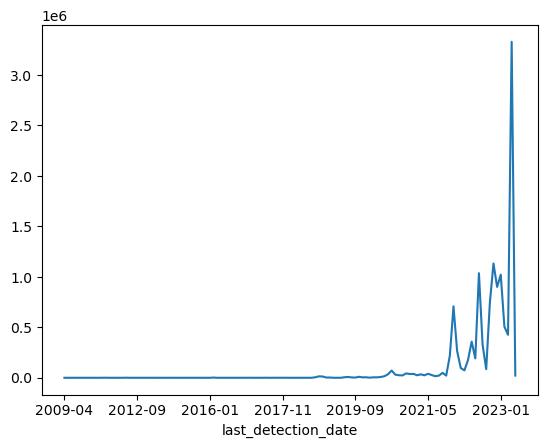

In [73]:
gdf.last_detection_date.value_counts().sort_index().plot()

In [21]:
gdf_sample = gdf_p.sample(1000)

In [45]:
bbox_taroudant = [-8.889742,30.463471,-8.868113,30.480079]
box_taroudant = box(*bbox_taroudant)

In [46]:
gdf_taroudan_p = gdf_p[gdf_p.within(box_taroudant)]

In [52]:
gdf_taroudan_b = gdf[gdf.within(box_taroudant)]

In [48]:
print(gdf_taroudan_p.shape)
print(gdf_taroudan_p.columns)

(12487, 7)
Index(['latitude', 'longitude', 'area_in_meters', 'confidence',
       'full_plus_code', 'last_detection_date', 'geometry'],
      dtype='object')


In [50]:
m = leafmap.Map()
m.add_basemap('SATELLITE')
geoson = gdf_taroudan_p.to_json()
m.add_data(geoson, "area_in_meters", marker=folium.CircleMarker(radius = 5, # Radius in metres
                                           weight = 0, #outline weight
                                           fill_color = '#000000', 
                                           fill_opacity = 1)
          )
m

In [53]:
m = leafmap.Map()
m.add_basemap('SATELLITE')
geoson = gdf_taroudan_b.to_json()
m.add_data(geoson, "area_in_meters")
m

### Building damage ground truth (estimation)

In [54]:
damage_root_path = "Data/raw/unosat/EQ20230909MAR_SHP/"

In [56]:
gdf_damage_taroudant_gt = gpd.read_file(os.path.join(damage_root_path, "PL_20230910_DamageAssessment_Taroudant.shp"))

In [64]:
gdf_damage_taroudant_gt = gdf_damage_taroudant_gt[gdf_damage_taroudant_gt.within(box_taroudant)]

In [74]:
gdf_damage_taroudant_gt.head()

,SensorDate,Settlement,Notes,EventCode,SiteID,SensorID,Confidence,FieldValid,Main_Dmg,Grouped_Da,StaffID,ImageID_Nu,geometry
181,2023-09-10,Taroudan,NaN,EQ20230909MAR,Building (Genaral/Default),Pleiades,To Be Evaluated,Not yet field validated,Possible damage,Damaged Buildings,VG,NaN,POINT (-8.88741 30.47662)
182,2023-09-10,Taroudan,NaN,EQ20230909MAR,Building (Genaral/Default),Pleiades,To Be Evaluated,Not yet field validated,Possible damage,Damaged Buildings,VG,NaN,POINT (-8.88731 30.47658)
183,2023-09-10,Taroudan,NaN,EQ20230909MAR,Building (Genaral/Default),Pleiades,To Be Evaluated,Not yet field validated,Possible damage,Damaged Buildings,VG,NaN,POINT (-8.88878 30.47751)
184,2023-09-10,Taroudan,NaN,EQ20230909MAR,Building (Genaral/Default),Pleiades,To Be Evaluated,Not yet field validated,Damage,Damaged Buildings,VG,NaN,POINT (-8.88704 30.47666)
185,2023-09-10,Taroudan,NaN,EQ20230909MAR,Building (Genaral/Default),Pleiades,To Be Evaluated,Not yet field validated,Possible damage,Damaged Buildings,VG,NaN,POINT (-8.88711 30.47659)


In [69]:
gdf_damage_taroudant_gt.Main_Dmg.value_counts()

Main_Dmg
Damage             114
Possible damage     75
Name: count, dtype: int64

In [71]:
gdf_damage_taroudant_gt.Grouped_Da.value_counts(dropna=False)

Grouped_Da
Damaged Buildings    189
Name: count, dtype: int64

In [67]:
m = leafmap.Map()
m.add_basemap('SATELLITE')
geoson = gdf_damage_taroudant_gt.to_json()
m.add_data(geoson, "Main_Dmg", marker=folium.CircleMarker(radius = 5, # Radius in metres
                                           #weight = 0, #outline weight
                                           fill_color = '#000000', 
                                           fill_opacity = 1)
          )
m